In [1]:
%load_ext autoreload
%autoreload 2

In [38]:
atac_path = '/om2/user/rogerjin/data/NeurIPS2021/multiome/multiome_atac_processed_training.h5ad'
cdna_path = '/om2/user/rogerjin/data/NeurIPS2021/multiome/multiome_gex_processed_training.h5ad'

In [39]:
# import sys

# num_bytes = sys.getsizeof(rna)

# def sizeof_fmt(num, suffix="B"):
#     # https://stackoverflow.com/questions/1094841/get-human-readable-version-of-file-size
#     for unit in ["", "Ki", "Mi", "Gi", "Ti", "Pi", "Ei", "Zi"]:
#         if abs(num) < 1024.0:
#             return f"{num:3.1f}{unit}{suffix}"
#         num /= 1024.0
#     return f"{num:.1f}Yi{suffix}"

# sizeof_fmt(num_bytes)

In [40]:
import scanpy as sc
import anndata as ad

sc.set_figure_params(dpi=300)
sc._settings.ScanpyConfig.n_jobs = 4

In [41]:
rna = ad.read_h5ad(cdna_path)

In [47]:
rna

AnnData object with n_obs × n_vars = 42492 × 13431
    obs: 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'cell_type', 'pseudotime_order_GEX', 'batch', 'pseudotime_order_ATAC', 'is_train', 'idx'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_id', 'organism', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [48]:
rna_subset = rna[:50, :]
rna_subset

View of AnnData object with n_obs × n_vars = 50 × 13431
    obs: 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'cell_type', 'pseudotime_order_GEX', 'batch', 'pseudotime_order_ATAC', 'is_train', 'idx'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_id', 'organism', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [49]:
rna_subset.write('scicar_rna_tiny.h5ad')

In [43]:
import pandas as pd
rna_genes = pd.read_csv(cdna_genes_path, header=None)

NameError: name 'cdna_genes_path' is not defined

In [ ]:
mito_genes = pd.read_csv('mitochondrial_genes.csv')
mito_genes

In [ ]:
# is_mito = rna_genes.apply(lambda gene: gene i
mito_gene_set = set(mito_genes.Symbol)
is_mito = rna_genes[0].apply(lambda gene: gene in mito_gene_set)

# compute % mitochondrial reads
rna.var_names = rna_genes[0]
rna.var['mt'] = rna.var_names.isin(mito_gene_set)

In [ ]:
rna.var['mt']

In [ ]:
sc.pp.calculate_qc_metrics(rna, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [ ]:
sc.pl.highest_expr_genes(rna, n_top=20)

In [ ]:
sc.pp.filter_cells(rna, min_genes=200)
sc.pp.filter_genes(rna, min_cells=3)

In [ ]:
sc.pl.violin(rna, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [ ]:
sc.pl.scatter(rna, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(rna, x='total_counts', y='n_genes_by_counts')

In [44]:
rna = rna[rna.obs.n_genes_by_counts < 2500, :]
rna = rna[rna.obs.pct_counts_mt < 5, :]

AttributeError: 'DataFrame' object has no attribute 'n_genes_by_counts'

In [45]:
rna.obs['idx'] = rna.obs.index
merged = rna.obs.merge(cell_types, on='cell_id')
rna = rna[merged.idx, :]
rna.obs['cell_type'] = merged.cell_type.values

NameError: name 'cell_types' is not defined

In [46]:
sc.pp.normalize_total(rna, target_sum=1e4)
sc.pp.log1p(rna)
sc.pp.highly_variable_genes(rna, min_mean=0.0125, max_mean=3, min_disp=0.5)

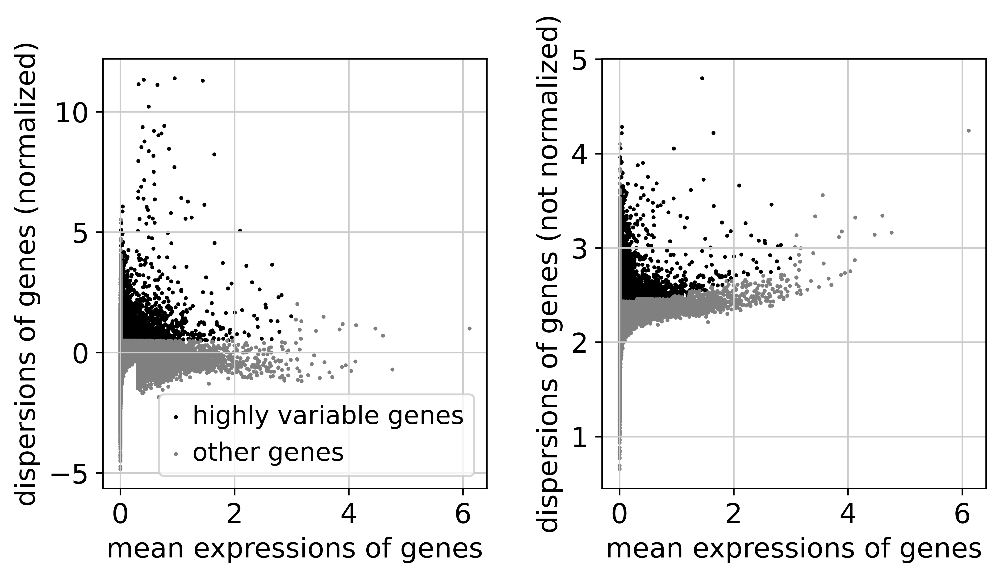

In [19]:
sc.pl.highly_variable_genes(rna)

In [20]:
sc.pp.regress_out(rna, ['total_counts', 'pct_counts_mt'])

... storing 'cell_type' as categorical


In [21]:
sc.pp.scale(rna, max_value=10)

In [22]:
sc.tl.pca(rna, svd_solver='arpack')

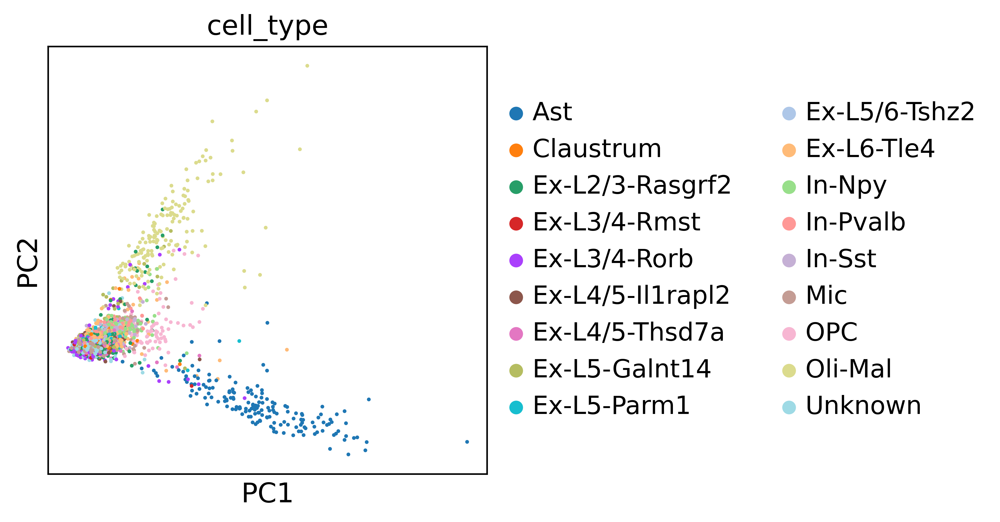

In [23]:
sc.pl.pca(rna, color='cell_type')

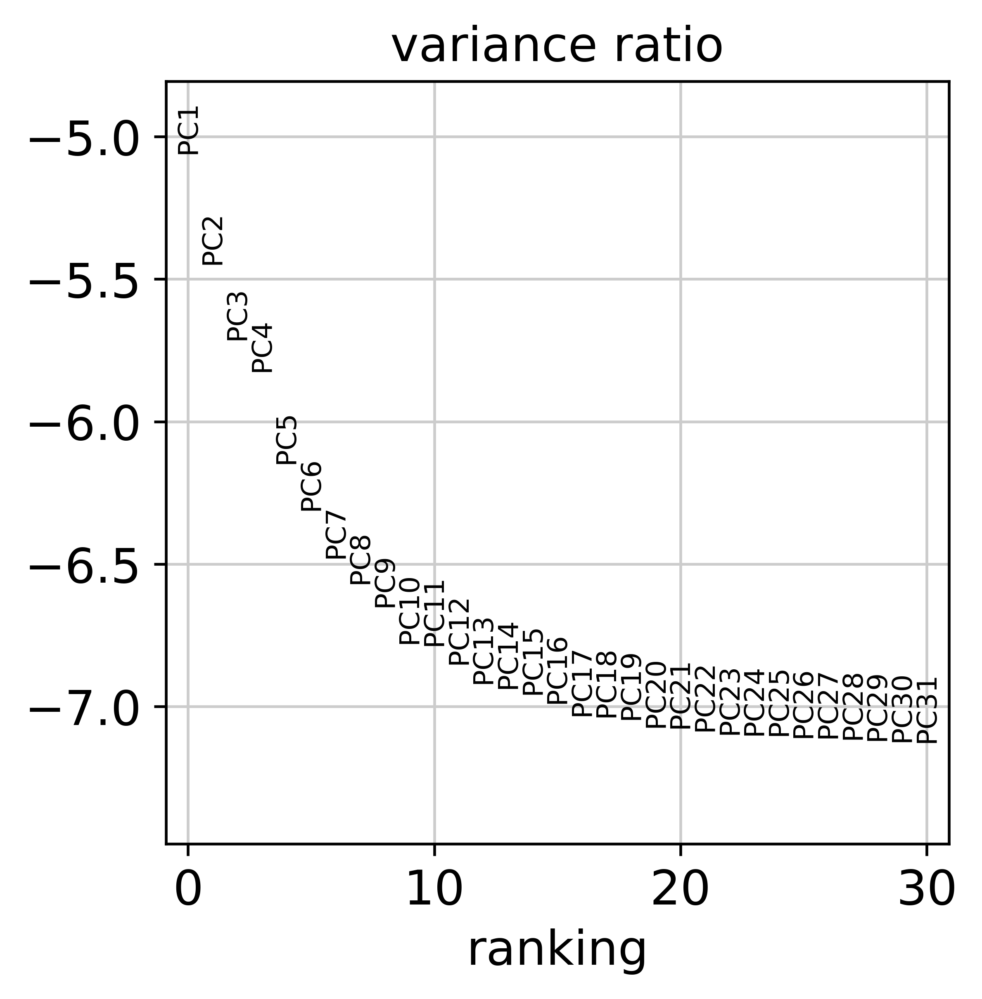

In [24]:
sc.pl.pca_variance_ratio(rna, log=True)

In [25]:
sc.pp.neighbors(rna, n_neighbors=10, n_pcs=40)

In [26]:
sc.tl.leiden(rna)
sc.tl.paga(rna)
sc.pl.paga(rna, plot=False)
sc.tl.umap(rna, init_pos='paga')

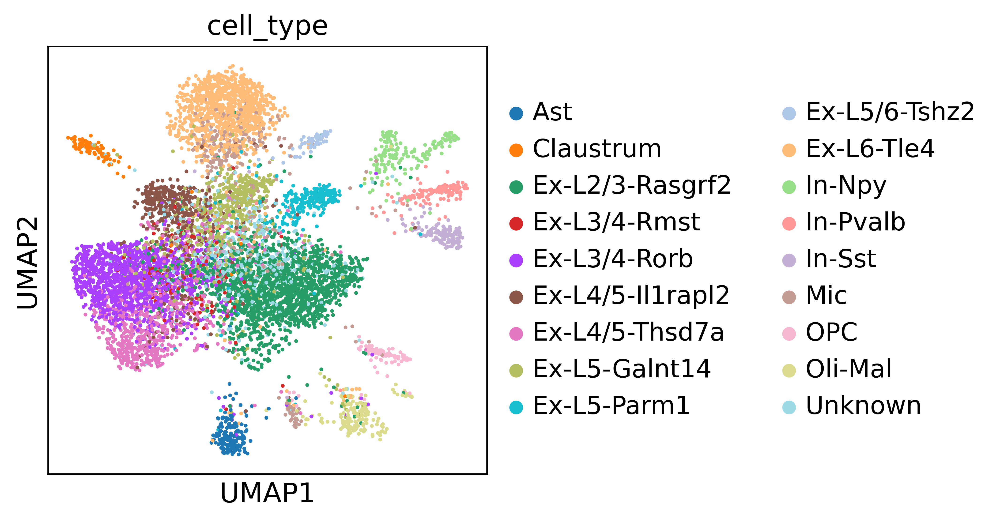

In [27]:
sc.pl.umap(rna, color='cell_type')

In [28]:
rna.write('snareseq_rna.h5ad')

In [29]:
import anndata as ad

rna = ad.read('snareseq_rna.h5ad')
rna

AnnData object with n_obs × n_vars = 8072 × 25403
    obs: 'cell_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'idx', 'cell_type', 'leiden'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# ATAC

In [3]:
import scanpy as sc
import scanpy as sc
import anndata as ad

sc.set_figure_params(dpi=300)
sc._settings.ScanpyConfig.n_jobs = 4

atac_path = '/om2/user/rogerjin/data/NeurIPS2021/multiome/multiome_atac_processed_training.h5ad'
atac = sc.read_h5ad(atac_path)
atac

AnnData object with n_obs × n_vars = 42492 × 116490
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train'
    var: 'feature_types'
    uns: 'dataset_id', 'gene_activity_var_names', 'organism', 'sample_pm_varnames'
    obsm: 'gene_activity', 'lsi_full', 'lsi_red', 'umap'
    layers: 'counts'

In [4]:
atac.var.feature_types

chr1-9776-10668            ATAC
chr1-180726-181005         ATAC
chr1-181117-181803         ATAC
chr1-191133-192055         ATAC
chr1-267562-268456         ATAC
                           ... 
GL000219.1-90062-90937     ATAC
GL000219.1-99257-100160    ATAC
KI270726.1-27152-28034     ATAC
KI270713.1-21434-22336     ATAC
KI270713.1-29629-30491     ATAC
Name: feature_types, Length: 116490, dtype: category
Categories (1, object): [ATAC]

In [5]:
import numpy as np

test_index = np.random.choice(atac.var.feature_types.index, size=123, replace=False)

In [6]:
subset = atac[:, [1,3,5]]
atac[:, subset.var.index]

View of AnnData object with n_obs × n_vars = 42492 × 3
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train'
    var: 'feature_types'
    uns: 'dataset_id', 'gene_activity_var_names', 'organism', 'sample_pm_varnames'
    obsm: 'gene_activity', 'lsi_full', 'lsi_red', 'umap'
    layers: 'counts'

In [7]:
atac.var.loc[subset.var.feature_types.index]

,feature_types
chr1-180726-181005,ATAC
chr1-191133-192055,ATAC
chr1-629497-630394,ATAC


In [9]:
import episcanpy.api as epi
from ganoli_plot import plot_umap

In [10]:
atac.obs

,nCount_peaks,atac_fragments,reads_in_peaks_frac,blacklist_fraction,nucleosome_signal,cell_type,pseudotime_order_ATAC,batch,pseudotime_order_GEX,is_train
TAGTTGTCACCCTCAC-1-s1d1,4031.0,5400,0.746481,0.003473,0.642468,Naive CD20+ B,NaN,s1d1,NaN,True
CTATGGCCATAACGGG-1-s1d1,8636.0,19266,0.448251,0.003126,1.220679,CD14+ Mono,NaN,s1d1,NaN,True
CCGCACACAGGTTAAA-1-s1d1,4674.0,6177,0.756678,0.001284,0.692573,CD8+ T,NaN,s1d1,NaN,True
TCATTTGGTAATGGAA-1-s1d1,2803.0,4019,0.697437,0.000714,0.633838,CD8+ T,NaN,s1d1,NaN,True
ACCACATAGGTGTCCA-1-s1d1,1790.0,2568,0.697040,0.003352,0.727660,CD16+ Mono,NaN,s1d1,NaN,True
...,...,...,...,...,...,...,...,...,...,...
ATTCACTTCCTGCGAA-14-s3d7,1349.0,3065,0.440131,0.000000,0.963134,CD8+ T,NaN,s3d7,NaN,True
GCTCTGTTCTGCAAGT-14-s3d7,8312.0,20679,0.401954,0.000241,0.756219,G/M prog,NaN,s3d7,NaN,True
GCTGAGGAGTGAGCGG-14-s3d7,2674.0,6903,0.387368,0.000000,0.941300,Erythroblast,0.828536,s3d7,0.791014,True
TACTGAGGTTCGCTCA-14-s3d7,3920.0,8229,0.476364,0.000510,0.788606,CD14+ Mono,NaN,s3d7,NaN,True


In [11]:
# remove any potential empty features or barcodes

epi.pp.filter_cells(atac, min_features=1)
epi.pp.filter_features(atac, min_cells=1)

In [12]:
atac

AnnData object with n_obs × n_vars = 42492 × 116490
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train', 'nb_features'
    var: 'feature_types', 'n_cells'
    uns: 'dataset_id', 'gene_activity_var_names', 'organism', 'sample_pm_varnames'
    obsm: 'gene_activity', 'lsi_full', 'lsi_red', 'umap'
    layers: 'counts'

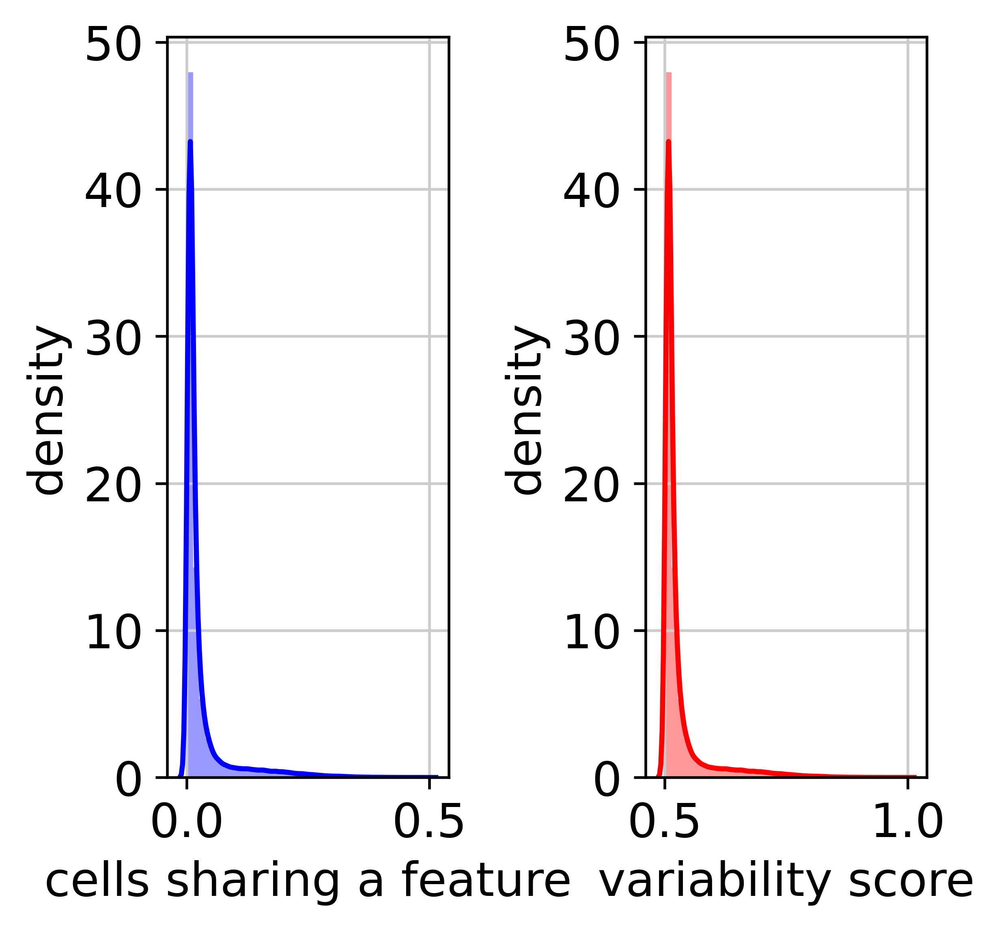

In [13]:
epi.pp.cal_var(atac)
atac = epi.pp.select_var_feature(atac,
                                  nb_features=5000, # 2000-5000
                                  show=False,
                                  copy=True)

In [14]:
atac

View of AnnData object with n_obs × n_vars = 42492 × 5001
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train', 'nb_features'
    var: 'feature_types', 'n_cells', 'prop_shared_cells', 'variability_score'
    uns: 'dataset_id', 'gene_activity_var_names', 'organism', 'sample_pm_varnames'
    obsm: 'gene_activity', 'lsi_full', 'lsi_red', 'umap'
    layers: 'counts'

In [15]:
epi.pp.filter_cells(atac, min_features=500)
epi.pp.filter_cells(atac, max_features=25000)

Trying to set attribute `.obs` of view, copying.


In [16]:
atac

AnnData object with n_obs × n_vars = 35127 × 5001
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train', 'nb_features'
    var: 'feature_types', 'n_cells', 'prop_shared_cells', 'variability_score'
    uns: 'dataset_id', 'gene_activity_var_names', 'organism', 'sample_pm_varnames'
    obsm: 'gene_activity', 'lsi_full', 'lsi_red', 'umap'
    layers: 'counts'

In [17]:
epi.pp.lazy(atac)

In [18]:
epi.pp.pca(atac) # 30-50

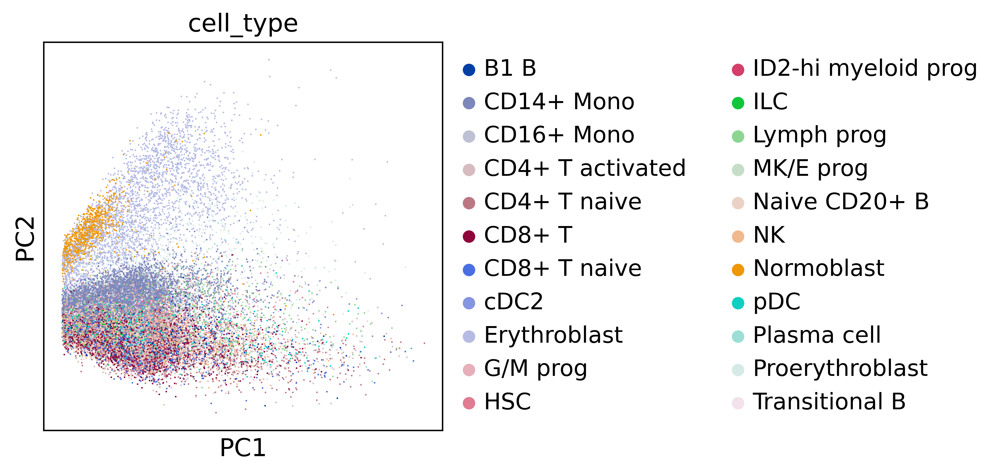

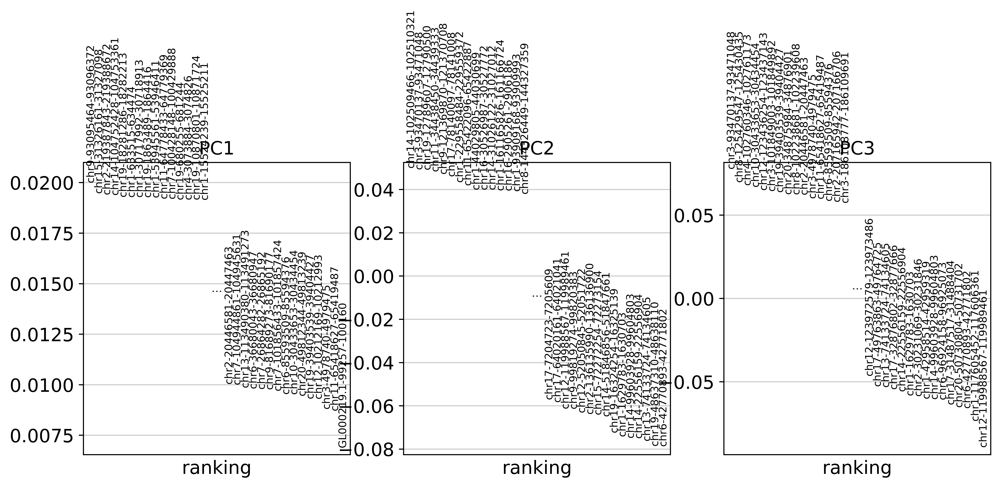

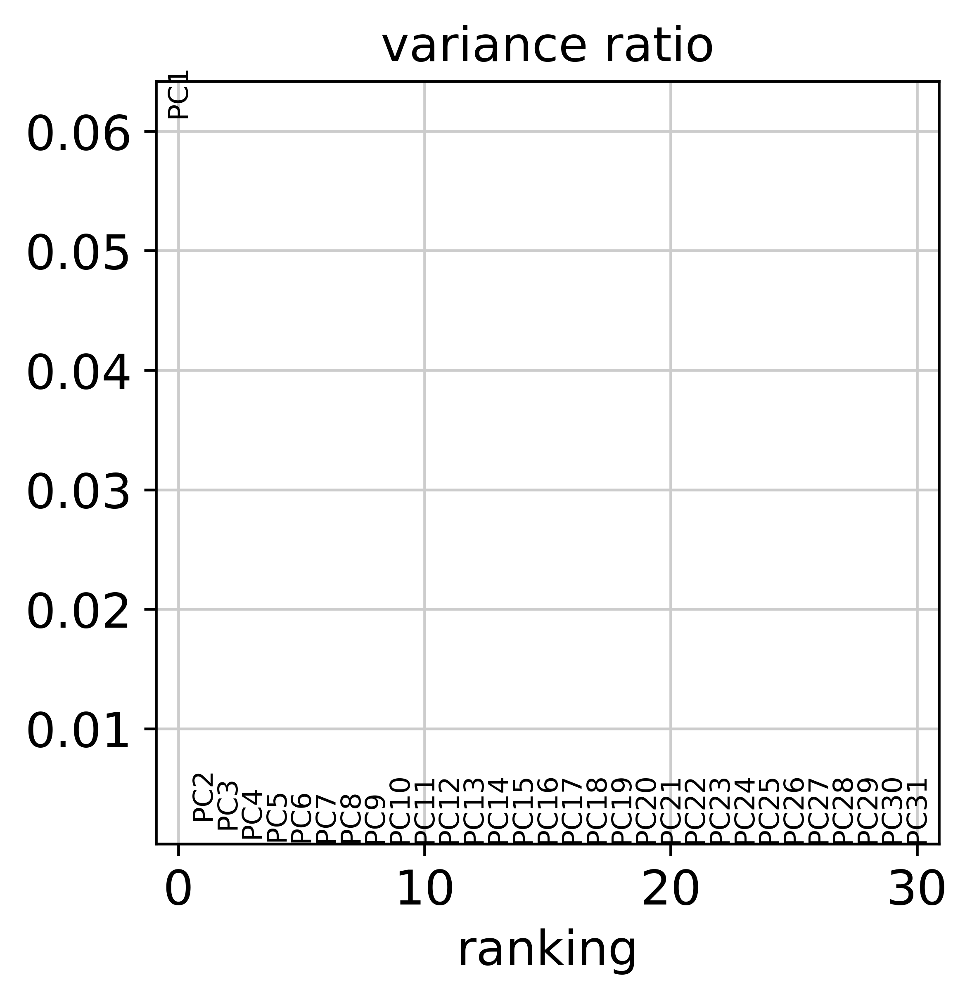

In [19]:
epi.pl.pca_overview(atac, color=['cell_type'], use_raw=False)

In [20]:
epi.tl.louvain(atac) # check if pc1 is used
# check if lsi is used

In [21]:
atac.obs.batch

TAGTTGTCACCCTCAC-1-s1d1     s1d1
CTATGGCCATAACGGG-1-s1d1     s1d1
CCGCACACAGGTTAAA-1-s1d1     s1d1
TCATTTGGTAATGGAA-1-s1d1     s1d1
TGGATTGGTTTGCGAA-1-s1d1     s1d1
                            ... 
AGATGAAGTTGCGGAT-14-s3d7    s3d7
GCTCTGTTCTGCAAGT-14-s3d7    s3d7
GCTGAGGAGTGAGCGG-14-s3d7    s3d7
TACTGAGGTTCGCTCA-14-s3d7    s3d7
CAATAAGCAGATAGAC-14-s3d7    s3d7
Name: batch, Length: 35127, dtype: category
Categories (10, object): [s1d1, s1d2, s1d3, s2d1, ..., s3d10, s3d3, s3d6, s3d7]

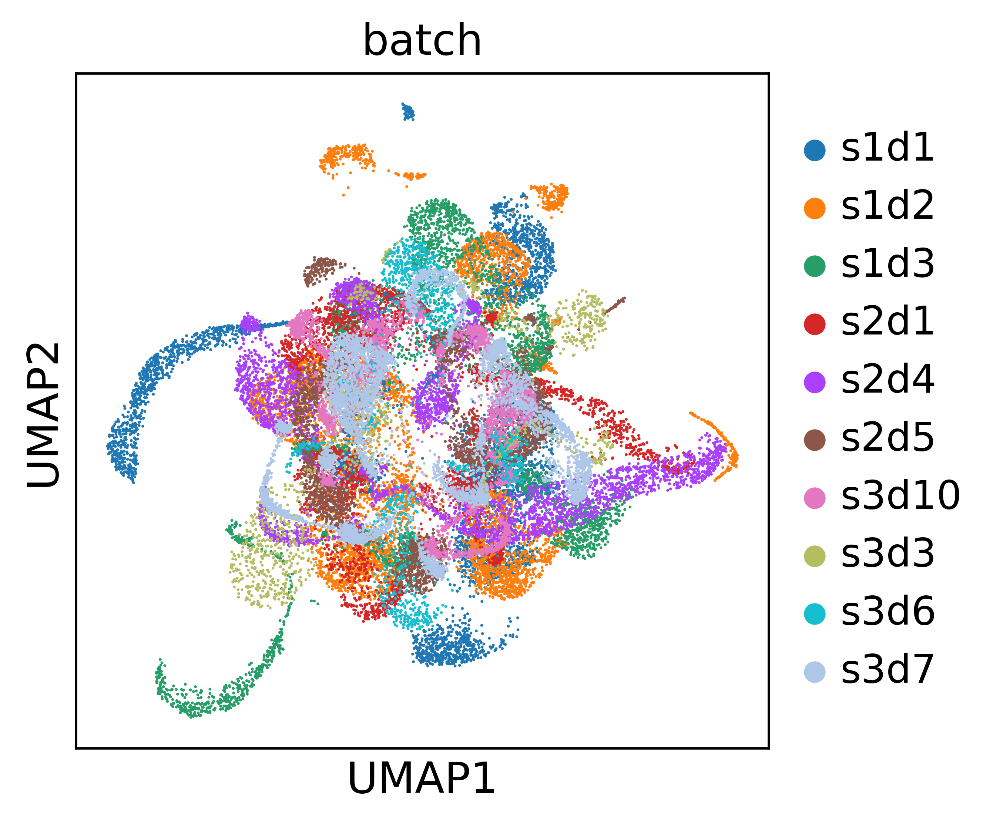

In [22]:
sc.pl.umap(atac, color=['batch']) 

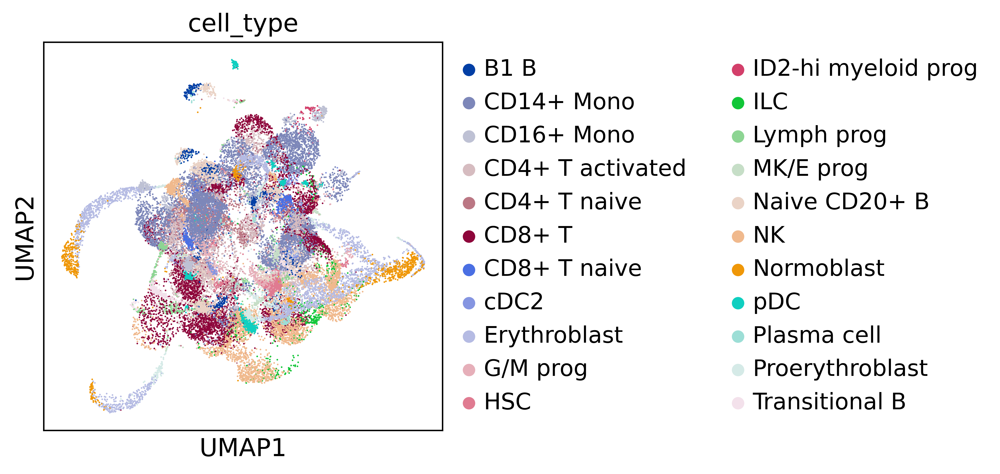

In [23]:
sc.pl.umap(atac, color=['cell_type']) 

In [24]:
atac.write('scicar_atac.h5ad')

In [25]:
atac = ad.read_h5ad('scicar_atac.h5ad')

In [26]:
from harmony import harmonize

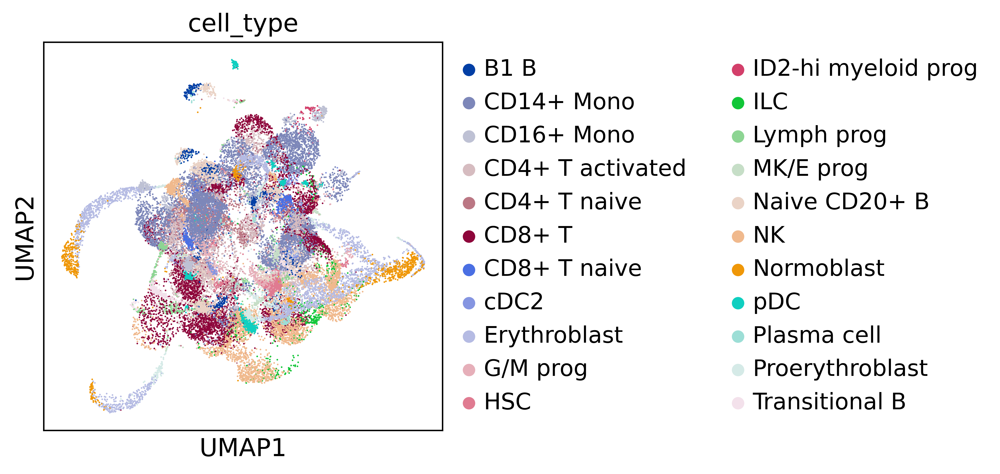

In [27]:
sc.pl.umap(atac, color='cell_type')

In [28]:
harmo = harmonize(atac.obsm['X_pca'], atac.obs, batch_key = 'batch', use_gpu = True, max_iter_harmony=20)

Use GPU mode.


Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md



	Initialization is completed.
	Completed 1 / 20 iteration(s).
	Completed 2 / 20 iteration(s).
	Completed 3 / 20 iteration(s).
	Completed 4 / 20 iteration(s).
	Completed 5 / 20 iteration(s).
Reach convergence after 5 iteration(s).


In [29]:
atac.obsm['X_harmony'] = harmo

In [30]:
atac

AnnData object with n_obs × n_vars = 35127 × 5001
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train', 'nb_features', 'louvain'
    var: 'feature_types', 'n_cells', 'prop_shared_cells', 'variability_score'
    uns: 'batch_colors', 'cell_type_colors', 'dataset_id', 'gene_activity_var_names', 'louvain', 'neighbors', 'organism', 'pca', 'sample_pm_varnames', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'gene_activity', 'lsi_full', 'lsi_red', 'umap', 'X_harmony'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

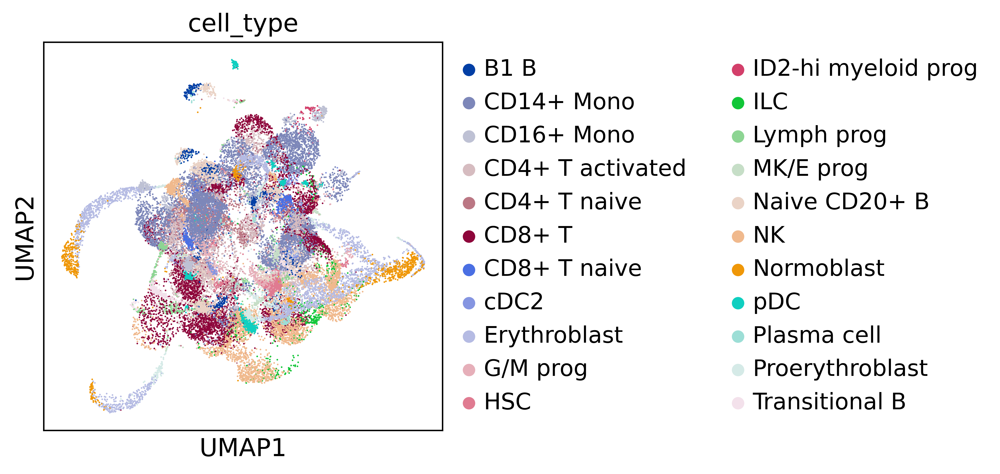

In [31]:
sc.pl.umap(atac, color='cell_type', neighbors_key='harmo')

### subset data

In [33]:
atac = ad.read_h5ad('scicar_atac.h5ad')
atac

AnnData object with n_obs × n_vars = 35127 × 5001
    obs: 'nCount_peaks', 'atac_fragments', 'reads_in_peaks_frac', 'blacklist_fraction', 'nucleosome_signal', 'cell_type', 'pseudotime_order_ATAC', 'batch', 'pseudotime_order_GEX', 'is_train', 'nb_features', 'louvain'
    var: 'feature_types', 'n_cells', 'prop_shared_cells', 'variability_score'
    uns: 'batch_colors', 'cell_type_colors', 'dataset_id', 'gene_activity_var_names', 'louvain', 'neighbors', 'organism', 'pca', 'sample_pm_varnames', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'gene_activity', 'lsi_full', 'lsi_red', 'umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [37]:
atac_subset = atac[:50, :]
atac_subset.write('scicar_atac_tiny.h5ad')